# Planning fieldwork: Nome

 - `rsync` ATL08 data from `MAAP` to `EXPLORE`
 - buffer seward roads and clip ATL08 within buffer
 - map the following to identify potential field sites: 
     - ATL08
     - CHM v1.0 footprints
     - LC v1.1 footprints

In [1]:
ICESAT2_BOREAL_REPO_PATH = '/home/pmontesa/code/icesat2_boreal'               #'/projects/icesat2_boreal' # /projects/Developer/icesat2_boreal/lib
ICESAT2_BOREAL_LIB_PATH = ICESAT2_BOREAL_REPO_PATH + '/lib'
import sys, os
import glob

sys.path.append(ICESAT2_BOREAL_LIB_PATH)
import matplotlib.pyplot as plt
import matplotlib
import geopandas as gpd
import pandas as pd
import contextily as ctx
import importlib

/tmp/ipykernel_1230508/2635813847.py:9: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
footprint_chm_gdf = gpd.read_file('/explore/nobackup/projects/above/misc/ABoVE_Shrubs/chm/20231014_chm/dm_10m/footprints/footprints_chm_20231023_vhrmeta.gpkg')
footprint_lc_gdf = gpd.read_file('/explore/nobackup/projects/ilab/projects/ABoVE-Shrubs/development/footprints/footprints_landcover_test_chm_std_local.gpkg')

In [3]:
import maplib_folium
import branca.colormap as cm
forest_height_colors = ['black','#636363','#fc8d59','#fee08b','#ffffbf','#d9ef8b','#91cf60','#1a9850']
pal_height_cmap = cm.LinearColormap(colors = forest_height_colors, vmin=0, vmax=5)
pal_height_cmap.caption = 'Vegetation height from  ATL08 @ 30 m (h_can; rh98)'
pal_height_cmap

In [4]:
from matplotlib.colors import LinearSegmentedColormap
forest_ht_cmap = LinearSegmentedColormap.from_list('forest_ht', forest_height_colors, 10)

<Axes: >

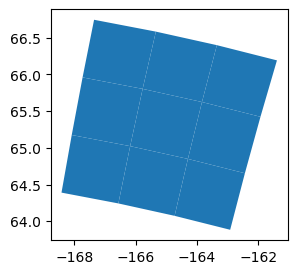

In [5]:
boreal_tiles = gpd.read_file('/explore/nobackup/people/pmontesa/userfs02/projects/above_icesat2/boreal_tiles/boreal_tiles_v004.gpkg')
boreal_tiles.to_crs(4326).cx[-167:-163,64.5:66.25].plot(figsize=(5,3))

In [6]:
# tiles of ATL08 data on the Seward Peninsula
SEWARD_TILE_LIST = [3543,3544,3545, 
                   3637,3638,3639,
                   3731,3732,3733] # Seward tiles
MAC_TILE_LIST = [2911,2912,2913] # near Mac Delta
FOCAL_TILE_LIST = boreal_tiles.tile_num.to_list()[0:10]

In [7]:
seward_roads= gpd.read_file('/explore/nobackup/people/pmontesa/userfs02/arc/sewpen_roads.shp')
seward_roads_buf = seward_roads.to_crs(3857).buffer(2e3).to_crs(4326)

### Duplicate checking...

In [8]:
def tile_reader(fn):
    tile_num = int(os.path.splitext(fn)[0].split('_')[-1])
    gdf = gpd.read_parquet(fn)
    gdf['tile_num'] = tile_num
    gdf['dir'] = os.path.basename(os.path.dirname(fn))
    gdf['file'] = os.path.basename(fn)
    return gdf

def chunker(seq, size):
    return [seq[pos:pos + size] for pos in range(0, len(seq), size)]

In [9]:
smry_cnt_orig_list = []
smry_cnt_dropdups_list = []
atl08_gdf_list = []
maindir = '/explore/nobackup/people/pmontesa/userfs02/data/icesat2/process_atl08_boreal/030m'

#for FOCAL_TILE_LIST in chunker(boreal_tiles.tile_num.to_list(), 100):
for FOCAL_TILE_LIST in [SEWARD_TILE_LIST]:
    for FOCAL_TILE in FOCAL_TILE_LIST:
        # Get the tindex for each each
        fn_list = glob.glob(f'{maindir}/**/atl08_006_030m_*_06_09_filt_*{FOCAL_TILE:05}.parquet') 
        if len(fn_list) > 0:
            atl08_gdf = pd.concat([tile_reader(fn) for fn in fn_list])
            smry_cnt_orig_list.append(atl08_gdf.groupby(['dir','file','tile_num','y']).aggregate(n_obs_year = ('y', 'count')).reset_index())
            smry_cnt_dropdups_list.append(atl08_gdf.drop_duplicates().groupby(['dir','file','tile_num','y']).aggregate(n_obs_year = ('y', 'count')).reset_index())
    
            atl08_gdf_list.append(atl08_gdf)

In [10]:
smry_cnt_orig_df = pd.concat(smry_cnt_orig_list)
smry_cnt_dropdups_df = pd.concat(smry_cnt_dropdups_list)

smry_cnt_merged = smry_cnt_orig_df.merge(smry_cnt_dropdups_df, how='left', on=['dir','file','tile_num','y'], suffixes=['_orig', '_nodups'])
smry_cnt_merged['dif'] = smry_cnt_merged.n_obs_year_orig - smry_cnt_merged.n_obs_year_nodups
smry_cnt_merged[smry_cnt_merged.tile_num == 3732]

,dir,file,tile_num,y,n_obs_year_orig,n_obs_year_nodups,dif
31,2019,atl08_006_030m_2019_2019_06_09_filt_003732.par...,3732,2019,5531,5531,0
32,2020,atl08_006_030m_2020_2020_06_09_filt_03732.parquet,3732,2020,12897,12897,0
33,2021,atl08_006_030m_2021_2021_06_09_filt_003732.par...,3732,2021,7115,7115,0
34,2022,atl08_006_030m_2022_2022_06_09_filt_003732.par...,3732,2022,7495,7495,0
35,2023,atl08_006_030m_2023_2023_06_09_filt_003732.par...,3732,2023,3814,3814,0


In [11]:
if False:
    smry_cnt_orig_df.to_csv('/explore/nobackup/people/pmontesa/userfs02/data/icesat2/process_atl08_boreal/smry_030m_tile_cnt_atl08_tmp-orig.csv')
    smry_cnt_dropdups_df.to_csv('/explore/nobackup/people/pmontesa/userfs02/data/icesat2/process_atl08_boreal/smry_030m_tile_cnt_atl08_tmp-dropdups.csv')
    smry_cnt_merged.to_csv('/explore/nobackup/people/pmontesa/userfs02/data/icesat2/process_atl08_boreal/smry_030m_tile_cnt_atl08_final.csv')

In [12]:
#smry_cnt_merged = pd.read_csv('/explore/nobackup/people/pmontesa/userfs02/data/icesat2/process_atl08_boreal/smry_030m_tile_cnt_atl08_final.csv')
#smry_cnt_merged[smry_cnt_merged.tile_num == 3732]

### Clip to roads buffer (drop dups)

In [10]:
atl08_gdf_roads = gpd.clip(pd.concat(atl08_gdf_list).drop_duplicates(), seward_roads_buf)

/tmp/ipykernel_1230508/903528733.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:7912
Right CRS: EPSG:4326

  atl08_gdf_roads = gpd.clip(pd.concat(atl08_gdf_list).drop_duplicates(), seward_roads_buf)


In [12]:
atl08_gdf_roads.head()

,solar_elevation,h_mean_canopy,h_max_canopy,h_canopy,segment_id,gnd_ph_count,gt,canopy_openness,extent_id,spot,...,y,m,d,doy,beam_type,tile_num,dir,file,binsize,num_bins
13790,-2.904214,0.360086,1.222595,1.222595,359485,24,50,0.338574,4976478635142686006,5,...,2022,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,NaN,NaN
13795,-2.903852,0.690740,1.609283,1.609283,359486,11,50,0.448967,4976478635142686010,5,...,2022,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,NaN,NaN
13802,-2.903668,0.341040,1.501312,1.501312,359488,17,50,0.451982,4976478635142686014,5,...,2022,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,NaN,NaN
13808,-2.903287,0.327021,1.740570,1.740570,359489,32,50,0.355796,4976478635142686018,5,...,2022,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,NaN,NaN
13813,-2.903110,0.300135,0.763855,0.763855,359491,36,50,0.191792,4976478635142686022,5,...,2022,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,NaN,NaN


In [14]:
atl08_gdf_roads.groupby(['y']).aggregate(n_obs_year = ('y', 'count')).reset_index()

,y,n_obs_year
0,2019,1180
1,2020,1881
2,2021,385
3,2022,1335
4,2023,337


In [16]:
atl08_gdf_roads.to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/atl08_seward_2km_roads.gpkg', driver='GPKG')

In [17]:
atl08_gdf_roads = gpd.read_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/atl08_seward_2km_roads.gpkg')

In [15]:
atl08_gdf_roads.head()

,solar_elevation,h_mean_canopy,h_max_canopy,h_canopy,segment_id,gnd_ph_count,gt,canopy_openness,extent_id,spot,...,m,d,doy,beam_type,tile_num,dir,file,binsize,num_bins,geometry
0,-2.904214,0.360086,1.222595,1.222595,359485,24,50,0.338574,4976478635142686006,5,...,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,None,None,POINT (-164.23045 64.64289)
1,-2.903852,0.690740,1.609283,1.609283,359486,11,50,0.448967,4976478635142686010,5,...,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,None,None,POINT (-164.23052 64.64316)
2,-2.903668,0.341040,1.501312,1.501312,359488,17,50,0.451982,4976478635142686014,5,...,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,None,None,POINT (-164.23059 64.64344)
3,-2.903287,0.327021,1.740570,1.740570,359489,32,50,0.355796,4976478635142686018,5,...,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,None,None,POINT (-164.23065 64.64370)
4,-2.903110,0.300135,0.763855,0.763855,359491,36,50,0.191792,4976478635142686022,5,...,6,3,154,strong,3733,2022,atl08_006_030m_2022_2022_06_09_filt_003733.par...,None,None,POINT (-164.23072 64.64397)


In [14]:
atl08_gdf_roads_01 = atl08_gdf_roads.iloc[0:2000]
atl08_gdf_roads_02 = atl08_gdf_roads.iloc[2000:4000]
atl08_gdf_roads_03 = atl08_gdf_roads.iloc[4000:]

In [12]:
import fiona
fiona.supported_drivers['KML'] = 'rw'

In [9]:
atl08_gdf_roads_01.to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/atl08_seward_2km_roads_01.kml', driver='KML')
atl08_gdf_roads_02.to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/atl08_seward_2km_roads_02.kml', driver='KML')
atl08_gdf_roads_03.to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/atl08_seward_2km_roads_03.kml', driver='KML')

In [14]:
road_access = gpd.read_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/sew_pen_roads_1milebuff_x_BLM_AK_Lands.shp.zip')
road_access.to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/sew_pen_roads_1milebuff_x_BLM_AK_Lands.kml', driver='KML')

In [18]:
atl08_gdf_roads.explore(tiles='https://services.arcgisonline.com/arcgis/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}', attr=' ')

In [17]:
m_atl08 = maplib_folium.map_tile_atl08(FOCAL_TILE_LIST, None, boreal_tiles, ATL08_filt_tindex_master_fn = atl08_gdf_roads,
                             DO_NIGHT=False,
                  map_width = 600, map_height=1200, OVERVIEW_MAP= True,
                  max_AGB_display = 50, max_AGBSE_display = 20
                 )

Input is dataframe

Num. of ATL08 obs. in tile [3543, 3544, 3545, 3637, 3638, 3639, 3731, 3732, 3733]: 	5118
64.814 -165.086


/home/pmontesa/code/icesat2_boreal/lib/maplib_folium.py:652: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  location = (boreal_tile_of_interest_gdf.geometry.centroid.y.median(), boreal_tile_of_interest_gdf.geometry.centroid.x.median()),
/home/pmontesa/code/icesat2_boreal/lib/maplib_folium.py:652: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  location = (boreal_tile_of_interest_gdf.geometry.centroid.y.median(), boreal_tile_of_interest_gdf.geometry.centroid.x.median()),


In [18]:
m_atl08

In [7]:
lvis_gdf = gpd.read_file('/explore/nobackup/people/pmontesa/userfs02/data/LVIS/LVIS_ABoVE_spatial_footprints_2017_2019.gpkg' , layer='LVISF2_2019')

In [18]:
lvis_seward_sub_gdf = lvis_gdf.to_crs(4326).cx[-170:-163,63:66]

In [20]:
lvis_seward_sub_gdf.iloc[0:20].to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/LVIS_ABoVE_spatial_footprints_2019_seward_01.kml', driver='KML')
lvis_seward_sub_gdf.iloc[20:].to_file('/explore/nobackup/people/pmontesa/userfs02/projects/ilab/above_shrubs/data/arc/LVIS_ABoVE_spatial_footprints_2019_seward_02.kml', driver='KML')